Filter out pune data

In [7]:
import pandas as pd

# Load dataset
df = pd.read_csv("Zomato_Data.csv")  # Replace with actual file path

# Filter for Pune City (Delivery Person ID starts with "PUNERES")
df_pune = df[df["Delivery_person_ID"].str.startswith("PUNERES")]

# Select important features and rename multiple_deliveries to order_freq
df_pune = df_pune[[
    "ID", "Delivery_person_ID", "Restaurant_latitude", "Restaurant_longitude",
    "Delivery_location_latitude", "Delivery_location_longitude",
    "Weather_conditions", "Road_traffic_density", "multiple_deliveries", "Time_taken (min)"
]].rename(columns={"multiple_deliveries": "order_freq"})

# Fill missing values (if any) with appropriate values
df_pune["Weather_conditions"].fillna("Clear", inplace=True)  # Default weather condition
df_pune["Road_traffic_density"].fillna("Medium", inplace=True)  # Default traffic density
df_pune["order_freq"].fillna(0, inplace=True)  # Fill missing order_freq with 0
df_pune["Time_taken (min)"].fillna(df_pune["Time_taken (min)"].median(), inplace=True)  # Fill with median time

# Increase order frequency by +1
df_pune["order_freq"] += 1

# Save processed dataset
df_pune.to_csv("pune_filtered_data.csv", index=False)

# Show the first few rows
df_pune[0:5]


C:\Users\HP\AppData\Local\Temp\ipykernel_3232\3617524223.py:17: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_pune["Weather_conditions"].fillna("Clear", inplace=True)  # Default weather condition
C:\Users\HP\AppData\Local\Temp\ipykernel_3232\3617524223.py:18: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values 

,ID,Delivery_person_ID,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Weather_conditions,Road_traffic_density,order_freq,Time_taken (min)
2,0x2784,PUNERES13DEL03,18.562450,73.916619,18.652450,74.006619,Sandstorms,Medium,2.0,21
7,0x689b,PUNERES20DEL01,18.592718,73.773572,18.702718,73.883572,Sandstorms,Jam,2.0,40
10,0x36b8,PUNERES19DEL02,18.563934,73.915367,18.643935,73.995367,Sandstorms,Jam,3.0,36
19,0x3c5e,PUNERES04DEL01,18.514210,73.838429,18.624210,73.948429,Windy,Low,1.0,12
25,0x30c8,PUNERES19DEL02,18.563934,73.915367,18.693935,74.045367,Cloudy,Low,2.0,30


In [9]:
df_pune.size

31320

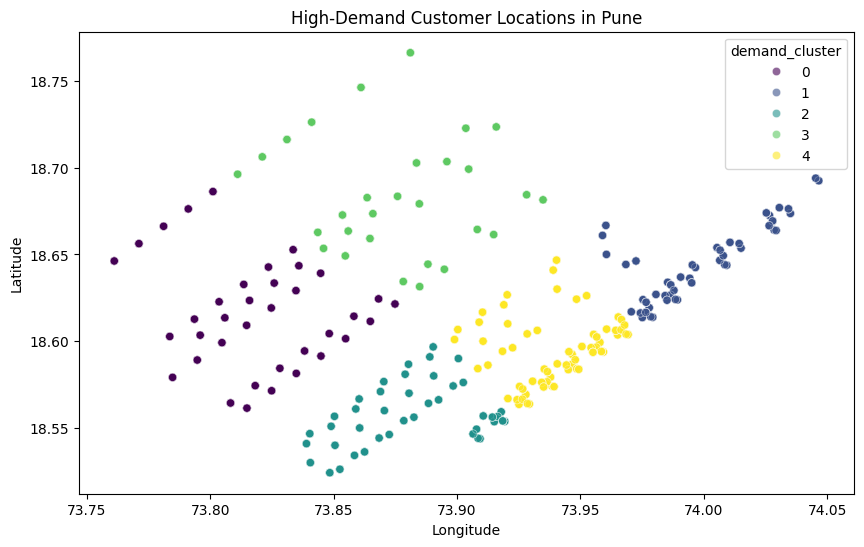

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans

# Load Pune dataset
df_pune = pd.read_csv("pune_filtered_data.csv")

# Extract delivery locations
delivery_locations = df_pune[["Delivery_location_latitude", "Delivery_location_longitude"]]

# Apply KMeans clustering to detect demand hotspots
num_clusters = 5  # Change based on analysis
kmeans = KMeans(n_clusters=num_clusters, random_state=42, n_init=10)
df_pune["demand_cluster"] = kmeans.fit_predict(delivery_locations)

# Plot Heatmap of Delivery Density
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x=df_pune["Delivery_location_longitude"],
    y=df_pune["Delivery_location_latitude"],
    hue=df_pune["demand_cluster"],
    palette="viridis",
    alpha=0.6
)
plt.title("High-Demand Customer Locations in Pune")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


In [11]:
# Group by clusters to check demand
cluster_demand = df_pune.groupby("demand_cluster")["order_freq"].sum().reset_index()
cluster_demand.columns = ["Cluster", "Total_Orders"]

# Check average delivery time in each cluster
cluster_time = df_pune.groupby("demand_cluster")["Time_taken (min)"].mean().reset_index()
cluster_time.columns = ["Cluster", "Avg_Delivery_Time"]

# Merge both data
demand_analysis = pd.merge(cluster_demand, cluster_time, on="Cluster")

# Define thresholds (Adjust based on business constraints)
max_orders_per_store = 100
max_delivery_time = 30  # Minutes

# Identify clusters where demand is too high or delivery is too slow
overloaded_clusters = demand_analysis[
    (demand_analysis["Total_Orders"] > max_orders_per_store) |
    (demand_analysis["Avg_Delivery_Time"] > max_delivery_time)
]

print("Overloaded Clusters (Potential New Dark Store Locations):")
print(overloaded_clusters)


Overloaded Clusters (Potential New Dark Store Locations):
   Cluster  Total_Orders  Avg_Delivery_Time
0        0         867.0          23.846591
1        1        1236.0          29.623167
2        2         960.0          23.271647
3        3         772.0          29.790094
4        4        1563.0          25.718372


In [13]:
pip install geopy

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/125.4 kB ? eta -:--:--
   ---------------------------------------- 0.0/125.4 kB ? eta -:--:--
   ------------------- -------------------- 61.4/125.4 kB ? eta -:--:--
   ----------------------------- ---------- 92.2/125.4 kB 1.3 MB/s eta 0:00:01
   ---------------------------------------- 125.4/125.4 kB 1.0 MB/s eta 0:00:00
   ---------------------------------------- 0.0/40.3 kB ? eta -:--:--
   ---------------------------------------- 40.3/40.3 kB 970.5 kB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.1.2 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [14]:
from geopy.distance import geodesic
import numpy as np

# Find cluster centers
new_dark_store_locations = []
for cluster in overloaded_clusters["Cluster"]:
    cluster_points = df_pune[df_pune["demand_cluster"] == cluster][
        ["Delivery_location_latitude", "Delivery_location_longitude"]
    ]
    center = cluster_points.mean().values  # Approximate center of demand
    new_dark_store_locations.append(center)

# Convert to DataFrame
new_dark_store_df = pd.DataFrame(new_dark_store_locations, columns=["Latitude", "Longitude"])
new_dark_store_df["Cluster"] = overloaded_clusters["Cluster"].values

print("Recommended New Dark Store Locations:")
print(new_dark_store_df)


Recommended New Dark Store Locations:
    Latitude  Longitude  Cluster
0  18.615964  73.819609        0
1  18.644258  73.997301        1
2  18.557889  73.881992        2
3  18.683635  73.875656        3
4  18.594493  73.939353        4


In [33]:
import numpy as np
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
from shapely.geometry import Polygon, LineString, MultiPoint
from sklearn.cluster import KMeans
from scipy.spatial import Voronoi, ConvexHull
from sklearn.metrics import silhouette_score
from folium.plugins import HeatMap

# # Load dataset
# df_pune = pd.read_csv("your_dataset.csv")  # Ensure correct file path

# Existing dark stores (Restaurants as dark stores)
existing_dark_stores = df_pune[['Restaurant_latitude', 'Restaurant_longitude']].dropna().values.tolist()

# Customer locations and demand
df_pune = df_pune.dropna(subset=['Delivery_location_latitude', 'Delivery_location_longitude'])
customer_locations = df_pune[['Delivery_location_latitude', 'Delivery_location_longitude']].values
customer_weights = df_pune['order_freq'].fillna(1).values  # Fill missing order frequencies

# Determine optimal k for clustering
sse, silhouette_scores = [], []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(customer_locations, sample_weight=customer_weights)
    sse.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(customer_locations, labels))

optimal_k = K_range[np.argmax(silhouette_scores)]
print(f"Optimal number of dark stores (k): {optimal_k}")

# Apply K-Means clustering
kmeans = KMeans(n_clusters=optimal_k, random_state=42, n_init=10)
df_pune['demand_cluster'] = kmeans.fit_predict(customer_locations, sample_weight=customer_weights)

# New dark store locations from cluster centers
new_dark_stores = kmeans.cluster_centers_

# Compute Voronoi regions
vor = Voronoi(new_dark_stores)

def voronoi_regions(vor):
    polygons = []
    for region in vor.regions:
        if not region or -1 in region:
            continue
        polygon = [vor.vertices[i] for i in region]
        polygons.append(Polygon(polygon))
    return polygons

voronoi_polygons = voronoi_regions(vor)
gdf_voronoi = gpd.GeoDataFrame(geometry=voronoi_polygons)

# Initialize Pune map
pune_map = folium.Map(
    location=[df_pune["Delivery_location_latitude"].mean(), df_pune["Delivery_location_longitude"].mean()], 
    zoom_start=12
)

# Customer demand heatmap
heat_data = [[lat, lon, weight] for (lat, lon), weight in zip(customer_locations, customer_weights)]
HeatMap(heat_data, radius=12, blur=8, max_zoom=15).add_to(pune_map)

# Plot Voronoi regions
for polygon in gdf_voronoi.geometry:
    geojson = gpd.GeoSeries([polygon]).__geo_interface__
    folium.GeoJson(geojson, style_function=lambda x: {'fillColor': 'lightblue', 'color': 'blue', 'weight': 1}).add_to(pune_map)

# Add existing dark stores (Green Markers)
for loc in existing_dark_stores:
    folium.Marker(
        location=loc,
        popup="Existing Dark Store (Restaurant)",
        icon=folium.Icon(color="green", icon="home")
    ).add_to(pune_map)

# Add new dark stores (Red Markers)
for idx, loc in enumerate(new_dark_stores):
    folium.Marker(
        location=[loc[0], loc[1]],
        popup=f"New Dark Store {idx+1}",
        icon=folium.Icon(color="red", icon="shopping-cart")
    ).add_to(pune_map)

# Draw cluster boundaries (Convex Hull with Dashed Line)
for cluster in df_pune["demand_cluster"].unique():
    cluster_points = df_pune[df_pune["demand_cluster"] == cluster][['Delivery_location_latitude', 'Delivery_location_longitude']].values
    
    if len(cluster_points) > 2:
        hull = ConvexHull(cluster_points)
        hull_points = [cluster_points[i] for i in hull.vertices] + [cluster_points[hull.vertices[0]]]
        hull_line = LineString(hull_points)
        
        folium.PolyLine(
            locations=[(p[0], p[1]) for p in hull_line.coords],
            color='black', dash_array='5,5', weight=2
        ).add_to(pune_map)

# Save and display the map
pune_map.save("pune_dark_store_map.html")
pune_map


Optimal number of dark stores (k): 8


In [35]:
df_pune.columns

Index(['ID', 'Delivery_person_ID', 'Restaurant_latitude',
       'Restaurant_longitude', 'Delivery_location_latitude',
       'Delivery_location_longitude', 'Weather_conditions',
       'Road_traffic_density', 'order_freq', 'Time_taken (min)',
       'demand_cluster'],
      dtype='object')

In [38]:
import numpy as np
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import HeatMap

# Load dataset
# df_pune = pd.read_csv("your_dataset.csv")  # Ensure correct file path

# Existing dark stores (Restaurants as dark stores)
existing_dark_stores = df_pune[['Restaurant_latitude', 'Restaurant_longitude']].dropna().values.tolist()

# Customer locations and demand
df_pune = df_pune.dropna(subset=['Delivery_location_latitude', 'Delivery_location_longitude'])
customer_locations = df_pune[['Delivery_location_latitude', 'Delivery_location_longitude']].values
customer_weights = df_pune['order_freq'].fillna(1).values  # Fill missing order frequencies

# Group by clusters to check demand
cluster_demand = df_pune.groupby("demand_cluster")["order_freq"].sum().reset_index()
cluster_demand.columns = ["Cluster", "Total_Orders"]

# Check average delivery time in each cluster
cluster_time = df_pune.groupby("demand_cluster")["Time_taken (min)"].mean().reset_index()
cluster_time.columns = ["Cluster", "Avg_Delivery_Time"]

# Merge both data
demand_analysis = pd.merge(cluster_demand, cluster_time, on="Cluster")

# Define thresholds
max_orders_per_store = 100
max_delivery_time = 30  # Minutes

# Identify overloaded clusters
overloaded_clusters = demand_analysis[
    (demand_analysis["Total_Orders"] > max_orders_per_store) |
    (demand_analysis["Avg_Delivery_Time"] > max_delivery_time)
]

# Find new dark store locations
new_dark_store_locations = []
for cluster in overloaded_clusters["Cluster"]:
    cluster_points = df_pune[df_pune["demand_cluster"] == cluster][
        ["Delivery_location_latitude", "Delivery_location_longitude"]
    ]
    center = cluster_points.mean().values  # Approximate center of demand
    new_dark_store_locations.append(center)

# Convert to DataFrame
new_dark_store_df = pd.DataFrame(new_dark_store_locations, columns=["Latitude", "Longitude"])
new_dark_store_df["Cluster"] = overloaded_clusters["Cluster"].values

# Initialize Pune map
pune_map = folium.Map(
    location=[df_pune["Delivery_location_latitude"].mean(), df_pune["Delivery_location_longitude"].mean()], 
    zoom_start=12, control_scale=True
)

# Customer demand heatmap
heat_data = [[lat, lon, weight] for (lat, lon), weight in zip(customer_locations, customer_weights)]
HeatMap(heat_data, radius=12, blur=8, max_zoom=15).add_to(pune_map)

# Existing dark stores (Green Home Icons)
for loc in existing_dark_stores:
    folium.Marker(
        location=loc,
        popup="Existing Dark Store (Restaurant)",
        tooltip="Existing Dark Store",
        icon=folium.Icon(color="green", icon="home")
    ).add_to(pune_map)

# New dark stores (Red Flag Icons)
for idx, loc in enumerate(new_dark_store_locations):
    folium.Marker(
        location=[loc[0], loc[1]],
        popup=f"Recommended New Dark Store {idx+1}",
        tooltip=f"New Dark Store {idx+1}",
        icon=folium.Icon(color="red", icon="flag")
    ).add_to(pune_map)

# Add interactive layer control
folium.LayerControl().add_to(pune_map)

# Save and display the map
pune_map.save("pune_dark_store_map.html")
pune_map


In [39]:
# considering factor of traffic

In [40]:
# Assign numerical values to traffic conditions
traffic_mapping = {"Low": 1, "Medium": 2, "High": 3, "Jam": 4}
df_pune["Traffic_Weight"] = df_pune["Road_traffic_density"].map(traffic_mapping).fillna(2)  # Default to Medium if missing


In [41]:
# Adjust max delivery time based on traffic
df_pune["Adjusted_Delivery_Time"] = df_pune["Time_taken (min)"] * df_pune["Traffic_Weight"]

# Recalculate cluster demand & delivery time
cluster_time = df_pune.groupby("demand_cluster")["Adjusted_Delivery_Time"].mean().reset_index()
cluster_time.columns = ["Cluster", "Traffic_Adjusted_Delivery_Time"]

# Merge updated analysis
demand_analysis = pd.merge(cluster_demand, cluster_time, on="Cluster")

# Update thresholds dynamically
max_orders_per_store = 100
base_max_delivery_time = 30  # Base minutes
demand_analysis["Dynamic_Max_Delivery_Time"] = base_max_delivery_time / demand_analysis["Traffic_Adjusted_Delivery_Time"].median()

# Identify overloaded clusters (with traffic consideration)
overloaded_clusters = demand_analysis[
    (demand_analysis["Total_Orders"] > max_orders_per_store) |
    (demand_analysis["Traffic_Adjusted_Delivery_Time"] > demand_analysis["Dynamic_Max_Delivery_Time"])
]

In [42]:
df_pune

,ID,Delivery_person_ID,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Weather_conditions,Road_traffic_density,order_freq,Time_taken (min),demand_cluster,Traffic_Weight,Adjusted_Delivery_Time
0,0x2784,PUNERES13DEL03,18.562450,73.916619,18.652450,74.006619,Sandstorms,Medium,2.0,21,1,2,42
1,0x689b,PUNERES20DEL01,18.592718,73.773572,18.702718,73.883572,Sandstorms,Jam,2.0,40,6,4,160
2,0x36b8,PUNERES19DEL02,18.563934,73.915367,18.643935,73.995367,Sandstorms,Jam,3.0,36,1,4,144
3,0x3c5e,PUNERES04DEL01,18.514210,73.838429,18.624210,73.948429,Windy,Low,1.0,12,2,1,12
4,0x30c8,PUNERES19DEL02,18.563934,73.915367,18.693935,74.045367,Cloudy,Low,2.0,30,1,1,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3127,0x7ab,PUNERES12DEL02,18.520016,73.830547,18.650016,73.960547,Stormy,Jam,1.0,22,2,4,88
3128,0x3d40,PUNERES18DEL01,18.593481,73.785901,18.703481,73.895901,Cloudy,Low,1.0,28,6,1,28
3129,0x46b6,PUNERES03DEL01,18.554382,73.798206,18.594382,73.838206,Windy,High,1.0,28,5,3,84
3130,0x7328,PUNERES08DEL01,18.534080,73.898520,18.604080,73.968520,Cloudy,Jam,2.0,47,2,4,188


In [43]:
from geopy.distance import geodesic

new_dark_store_locations = []
for cluster in overloaded_clusters["Cluster"]:
    cluster_points = df_pune[df_pune["demand_cluster"] == cluster][["Delivery_location_latitude", "Delivery_location_longitude", "Traffic_Weight"]]

    # Find weighted center based on traffic (favoring lower traffic areas)
    weighted_lat = np.average(cluster_points["Delivery_location_latitude"], weights=1 / cluster_points["Traffic_Weight"])
    weighted_lon = np.average(cluster_points["Delivery_location_longitude"], weights=1 / cluster_points["Traffic_Weight"])
    
    new_dark_store_locations.append([weighted_lat, weighted_lon])

# Convert to DataFrame
new_dark_store_df = pd.DataFrame(new_dark_store_locations, columns=["Latitude", "Longitude"])
new_dark_store_df["Cluster"] = overloaded_clusters["Cluster"].values


In [44]:
import numpy as np
import pandas as pd
import geopandas as gpd
import folium
from folium.plugins import HeatMap, MarkerCluster
from geopy.distance import geodesic

# Load dataset
# df_pune = pd.read_csv("your_dataset.csv")  # Ensure correct file path

# Map traffic density to numerical values
traffic_mapping = {"Low": 1, "Medium": 2, "High": 3, "Jam": 4}
df_pune["Traffic_Weight"] = df_pune["Road_traffic_density"].map(traffic_mapping).fillna(2)  # Default to Medium

# Existing dark stores (Restaurants as dark stores)
existing_dark_stores = df_pune[['Restaurant_latitude', 'Restaurant_longitude']].dropna().values.tolist()

# Customer locations and demand
df_pune = df_pune.dropna(subset=['Delivery_location_latitude', 'Delivery_location_longitude'])
customer_locations = df_pune[['Delivery_location_latitude', 'Delivery_location_longitude']].values
customer_weights = df_pune['order_freq'].fillna(1).values  # Fill missing order frequencies

# Group by clusters to check demand
cluster_demand = df_pune.groupby("demand_cluster")["order_freq"].sum().reset_index()
cluster_demand.columns = ["Cluster", "Total_Orders"]

# Adjust max delivery time based on traffic
df_pune["Adjusted_Delivery_Time"] = df_pune["Time_taken (min)"] * df_pune["Traffic_Weight"]

# Check average traffic-adjusted delivery time
cluster_time = df_pune.groupby("demand_cluster")["Adjusted_Delivery_Time"].mean().reset_index()
cluster_time.columns = ["Cluster", "Traffic_Adjusted_Delivery_Time"]

# Merge both data
demand_analysis = pd.merge(cluster_demand, cluster_time, on="Cluster")

# Define thresholds
max_orders_per_store = 100
base_max_delivery_time = 30  # Base minutes
demand_analysis["Dynamic_Max_Delivery_Time"] = base_max_delivery_time / demand_analysis["Traffic_Adjusted_Delivery_Time"].median()

# Identify overloaded clusters (with traffic consideration)
overloaded_clusters = demand_analysis[
    (demand_analysis["Total_Orders"] > max_orders_per_store) |
    (demand_analysis["Traffic_Adjusted_Delivery_Time"] > demand_analysis["Dynamic_Max_Delivery_Time"])
]

# Find new dark store locations prioritizing low-traffic areas
new_dark_store_locations = []
for cluster in overloaded_clusters["Cluster"]:
    cluster_points = df_pune[df_pune["demand_cluster"] == cluster][["Delivery_location_latitude", "Delivery_location_longitude", "Traffic_Weight"]]
    
    # Weighted center favoring lower traffic areas
    weighted_lat = np.average(cluster_points["Delivery_location_latitude"], weights=1 / cluster_points["Traffic_Weight"])
    weighted_lon = np.average(cluster_points["Delivery_location_longitude"], weights=1 / cluster_points["Traffic_Weight"])
    
    new_dark_store_locations.append([weighted_lat, weighted_lon])

# Convert to DataFrame
new_dark_store_df = pd.DataFrame(new_dark_store_locations, columns=["Latitude", "Longitude"])
new_dark_store_df["Cluster"] = overloaded_clusters["Cluster"].values

# Initialize Pune map
pune_map = folium.Map(
    location=[df_pune["Delivery_location_latitude"].mean(), df_pune["Delivery_location_longitude"].mean()], 
    zoom_start=12, control_scale=True
)

# Customer demand heatmap
heat_data = [[lat, lon, weight] for (lat, lon), weight in zip(customer_locations, customer_weights)]
HeatMap(heat_data, radius=12, blur=8, max_zoom=15).add_to(pune_map)

# Existing dark stores (Green Icons)
for loc in existing_dark_stores:
    folium.Marker(
        location=loc,
        popup="Existing Dark Store (Restaurant)",
        tooltip="Existing Dark Store",
        icon=folium.Icon(color="green", icon="home")
    ).add_to(pune_map)

# New dark stores (Red Icons)
for idx, loc in enumerate(new_dark_store_locations):
    folium.Marker(
        location=[loc[0], loc[1]],
        popup=f"Recommended New Dark Store {idx+1}",
        tooltip=f"New Dark Store {idx+1}",
        icon=folium.Icon(color="red", icon="flag")
    ).add_to(pune_map)

# Add interactive layer control
folium.LayerControl().add_to(pune_map)

# Save and display the map
pune_map.save("pune_dark_store_map.html")
pune_map
